<h1 style="text-align: center;">
<div style="color:grey; font-size: 0.6em;">Jakub Ostrzołek</div>
<div>WMM lab. 5 - właściwości obrazów</div>
</h1>

## Przygotowanie
### Przygotowanie bibliotek i ścieżek do plików
Numer przydzielonego mi obrazka to:

$$310864 \; mod \; 36 = 4$$

, zatem będę pracował na obrazach o nazwie `bikes_*.png`

![bikes_col.png](obrazy/color/bikes_col.png)

![bikes_mono.png](obrazy/monochrome/bikes_mono.png)

In [45]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path

data_dir = Path("./obrazy")
img_basename = "bikes"
img_paths = {key: str(path) for key, path in {
    "color"        : data_dir / "color"         / f"{img_basename}_col.png"       ,
    "color_inoise1": data_dir / "color_inoise1" / f"{img_basename}_col_inoise.png",
    "color_inoise2": data_dir / "color_inoise2" / f"{img_basename}_col_inoise.png",
    "color_noise"  : data_dir / "color_noise"   / f"{img_basename}_col_noise.png" ,
    "monochrome"   : data_dir / "monochrome"    / f"{img_basename}_mono.png" ,
}.items()}

out_dir_root = Path("./out")
out_dir_root.mkdir()

### Przygotowanie funkcji pomocniczych
Przed wyświetleniem obrazka w `matplotlib` trzeba go przekonwertować na przestrzeń kolorów domyślnie wspieraną przez tę     bibliotekę - RGB zamiast BGR. 

Dodatkowo dla bitmap ze znakiem zmieniany jest zasięg wartości wyświetlanych pikseli (teoretycznie dla typu int16 zakres powinien być dużo większy niż (-255, 255), ale tylko z takiego korzystamy w dalszych zadaniach)

In [4]:
def imshow(img: np.ndarray, img_title: str = "image",
           out_dir: str | Path = None, out_basename: str = None):
    """Pomocnicza funkcja do wyświetlania i zapisywania obrazów"""
    plt.figure(figsize=(15, 10))
    plt.title(img_title)

    vmin=0
    vmax=255

    if (img.dtype == np.float32) or (img.dtype == np.float64):
        img_ = img / 255
    elif img.dtype == np.int16:
        vmin = -255
        vmax = 255
        img_ = img
    else:
        img_ = img

    # konwersja na przestrzeń RGB wspieraną przez matplotlib
    if (len(img_.shape) == 3):
        img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    # bez skalowania wartości pikseli
    plt.imshow(img_, cmap="gray", vmin=vmin, vmax=vmax)
    plt.xticks([]), plt.yticks([])

    if out_dir is not None:
        out_dir = Path(out_dir)
        out_dir.mkdir(parents=True, exist_ok=True)
        if out_basename is None:
            out_filename = out_dir / f"{img_title}.png"
        else:
            out_filename = out_dir / out_basename
        cv2.imwrite(str(out_filename), img)

    plt.show()
    plt.close()


def printi(img, img_title="image"):
    """ Pomocnicza funkcja do wypisania informacji o obrazie. """
    print(f"{img_title}, wymiary: {img.shape}, typ danych: {img.dtype}, wartości: {img.min()} - {img.max()}")


# Obraz monochromatyczny
## Obliczanie przepływności bitowej

In [5]:
image = cv2.imread(img_paths["monochrome"], cv2.IMREAD_UNCHANGED)
printi(image, "image")

bitrate = 8 * os.stat(img_paths["monochrome"]).st_size / (image.shape[0] * image.shape[1])
print(f"bitrate: {bitrate:.4f}")


image, wymiary: (512, 768), typ danych: uint8, wartości: 2 - 255
bitrate: 5.8110


## Obliczanie entropii obrazu

In [6]:
def calc_entropy(hist):
    # normalizacja histogramu -> rozkład prawdopodobieństwa; UWAGA:
    # niebezpieczeństwo '/0' dla 'zerowego' histogramu!!!
    pdf = hist / hist.sum()
    # entropy = -(pdf*np.log2(pdf)).sum() ### zapis na tablicach, ale problem
    # z '/0'
    entropy = -sum([x * np.log2(x) for x in pdf if x != 0])
    return entropy

hist_image = cv2.calcHist([image], [0], None, [256], [0, 256]).flatten()

H_image = calc_entropy(hist_image)
print(f"H(image) = {H_image:.4f}")


H(image) = 7.3599


> Czy przepływność mniejsza od entropii oznacza, że zależność: $l_{śr} \ge H$ jest nieprawdziwa?

Nie, w formacie png obraz jest kopresowany (bezstratnie), przez co ma mniejszą entropię od surowej bitmapy. Natomiast powyższa wartość dotyczy właśnie takiej surowej bitmapy.

## Obraz różnicowy

### Wyznaczenie obrazu różnicowego

image_hdiff, wymiary: (512, 767), typ danych: int16, wartości: -211 - 219
image_hdiff_0, wymiary: (512, 1), typ danych: int16, wartości: -95 - -28
image_hdiff, wymiary: (512, 768), typ danych: int16, wartości: -211 - 219


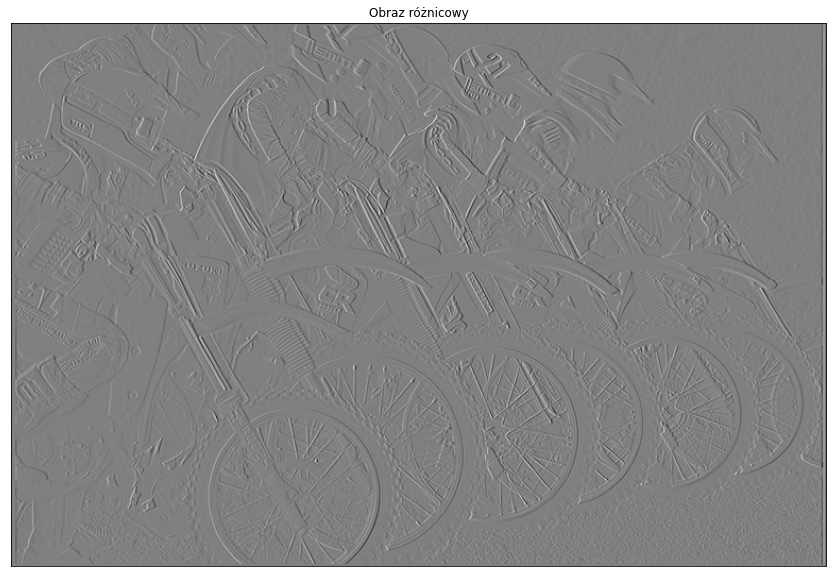

In [28]:
"""
Predykcja w kierunku poziomym:
od wartości danego piksela odejmowana jest wartość piksela z lewej strony - 'lewego sąsiada' (operacje na kolumnach).
Operację taką można wykonać dla pikseli leżących w drugiej i kolejnych kolumnach obrazu, z pominięciem skrajnie lewej kolumny.
"""
# wszystkie wiersze (':'), kolumny od 'pierwszej' do ostatniej ('1:')
img_tmp1 = image[:, 1:]
# wszystkie wiersze, kolumny od 'zerowej' do przedostatniej (':-1')
img_tmp2 = image[:, :-1]

"""
W wyniku odejmowania pojawią się wartości ujemne - zakres wartości pikseli w obrazie różnicowym to będzie [-255, 255],
dlatego trzeba zminić typ wartości pikseli, żeby zakres wartości nie ograniczał się do [0, 255];
może to być np. cv2.CV_16S (odpowiednio np.int16 w NumPy), żeby pozostać w domenie liczb całkowitych.
"""
image_hdiff = cv2.addWeighted(img_tmp1, 1, img_tmp2, -1, 0, dtype=cv2.CV_16S)
printi(image_hdiff, "image_hdiff")
"""
image_hdiff ma o jedną kolumnę mniej - dla skrajnie lewej kolumny nie było danych do odejmowania,
kolumnę tę można potraktować oddzielnie i 'połączyć' wyniki.
"""
# od 'zerowej' kolumny obrazu oryginalnego odejmowana stała wartość '127'R
image_hdiff_0 = cv2.addWeighted(
    image[:, 0], 1, 0, 0, -127, dtype=cv2.CV_16S)
printi(image_hdiff_0, "image_hdiff_0")
# połączenie tablic w kierunku poziomym, czyli 'kolumna za kolumną'
image_hdiff = np.hstack((image_hdiff_0, image_hdiff))
printi(image_hdiff, "image_hdiff")

imshow(image_hdiff, "Obraz różnicowy")


### Histogram obrazu różnicowego

H(hdiff) = 5.8910


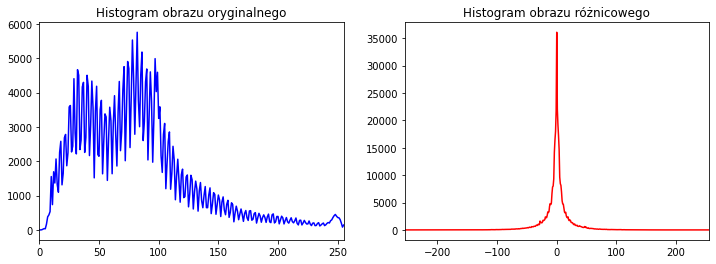

In [29]:

"""
cv2.calcHist() wymaga danych w formacie liczb całkowitych bez znaku (8- lub 16-bitowych) lub 32-bitowych liczb rzeczywistych,
dlatego wartości pikseli są przesuwane z zakresu [-255, 255] do [0, 510] (-> '+255')
oraz konwertowane na typ np.uint16 (-> astype()).
"""
image_tmp = (image_hdiff + 255).astype(np.uint16)
hist_hdiff = cv2.calcHist([image_tmp], [0], None, [511], [0, 511]).flatten()

H_hdiff = calc_entropy(hist_hdiff)
print(f"H(hdiff) = {H_hdiff:.4f}")

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(hist_image, color="blue")
plt.title("Histogram obrazu oryginalnego")
plt.xlim([0, 255])
# jawne podane wartości 'x' i 'y', żeby zmienić opisy na osi poziomej
plt.subplot(1, 2, 2)
plt.plot(np.arange(-255, 256, 1), hist_hdiff, color="red")
plt.title("Histogram obrazu różnicowego")
plt.xlim([-255, 255])
plt.show()


Jak można się było spodziewać, histogram obrazu różnicowego jest znacznie bardziej skupiony (wokół 0) i przyjmuje wartości z mniejszego zakresu. Dzięki temu można go zapisać na mniejszej liczbie bitów, a więc i entropia jest mniejsza (chociaż dalej większa niż przepływność bitowa obrazu PNG).

## Transformacja DWT
### Funkcja transformacji DWT

In [18]:
def dwt(img):
    """
    Bardzo prosta i podstawowa implementacja, nie uwzględniająca efektywnych metod obliczania DWT
    i dopuszczająca pewne niedokładności.
    """
    maskL = np.array([0.02674875741080976, -0.01686411844287795, -0.07822326652898785, 0.2668641184428723,
                      0.6029490182363579, 0.2668641184428723, -0.07822326652898785, -0.01686411844287795, 0.02674875741080976])
    maskH = np.array([0.09127176311424948, -0.05754352622849957, -0.5912717631142470, 1.115087052456994,
                      -0.5912717631142470, -0.05754352622849957, 0.09127176311424948])

    bandLL = cv2.sepFilter2D(img, -1, maskL, maskL)[::2, ::2]
    # ze względu na filtrację górnoprzepustową -> wartości ujemne, dlatego
    # wynik 16-bitowy ze znakiem
    bandLH = cv2.sepFilter2D(img, cv2.CV_16S, maskL, maskH)[::2, ::2]
    bandHL = cv2.sepFilter2D(img, cv2.CV_16S, maskH, maskL)[::2, ::2]
    bandHH = cv2.sepFilter2D(img, cv2.CV_16S, maskH, maskH)[::2, ::2]

    return bandLL, bandLH, bandHL, bandHH


### Zastosowanie transformacji DWT

LL, wymiary: (256, 384), typ danych: uint8, wartości: 0 - 255
LH, wymiary: (256, 384), typ danych: int16, wartości: -126 - 139
HL, wymiary: (256, 384), typ danych: int16, wartości: -139 - 151
HH, wymiary: (256, 384), typ danych: int16, wartości: -164 - 212


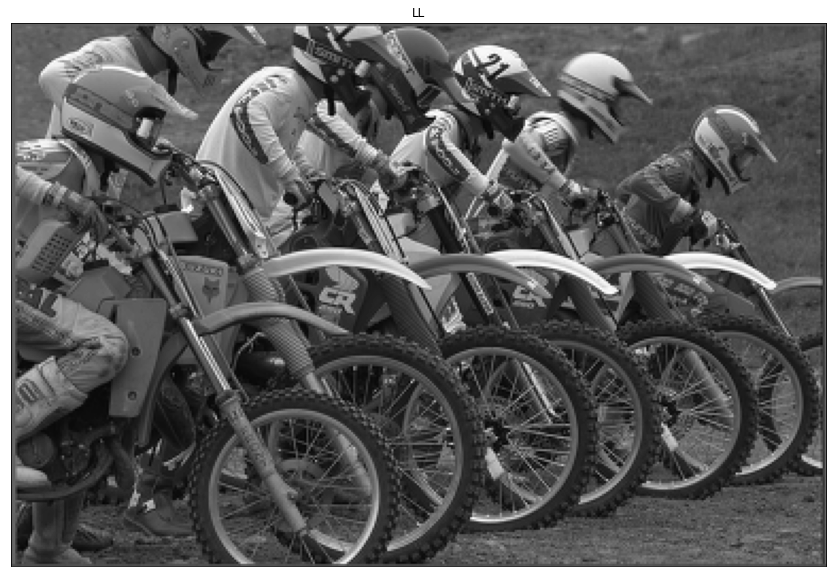

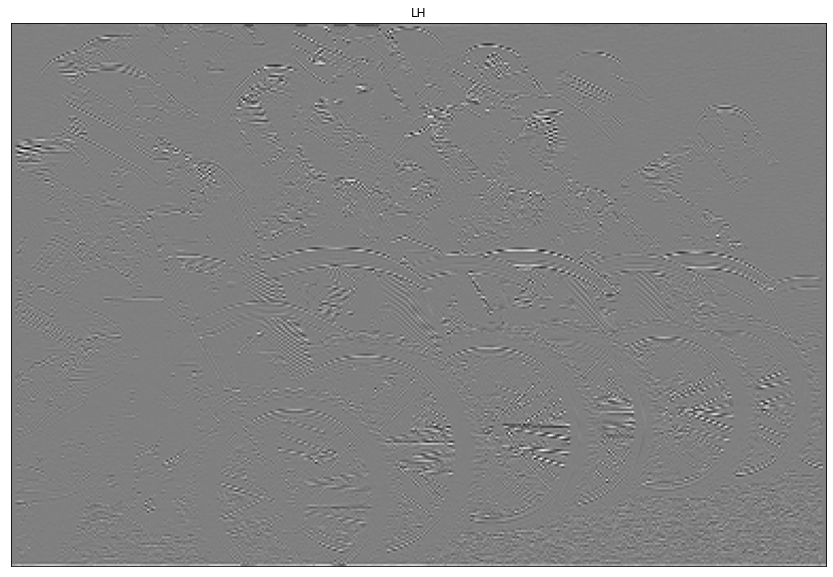

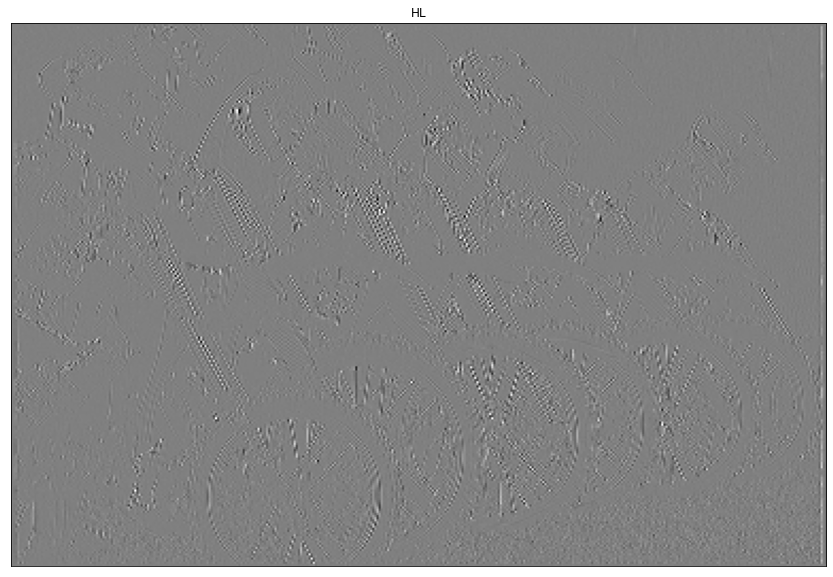

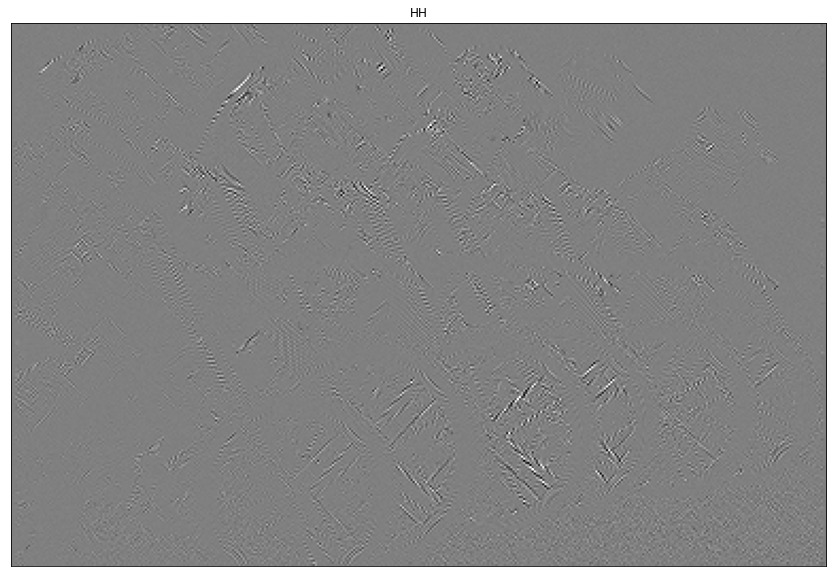

In [30]:
ll, lh, hl, hh = dwt(image)
printi(ll, "LL")
printi(lh, "LH")
printi(hl, "HL")
printi(hh, "HH")

imshow(ll, "LL")
# cv2.multiply() -> zwiększenie kontrastu obrazów 'H', żeby lepiej uwidocznić
imshow(cv2.multiply(lh, 2), "LH")
imshow(cv2.multiply(hl, 2), "HL")
imshow(cv2.multiply(hh, 2), "HH")


### Histogramy obrazu przetransformowanego

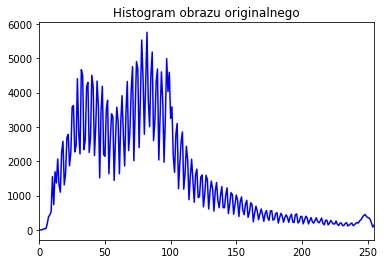

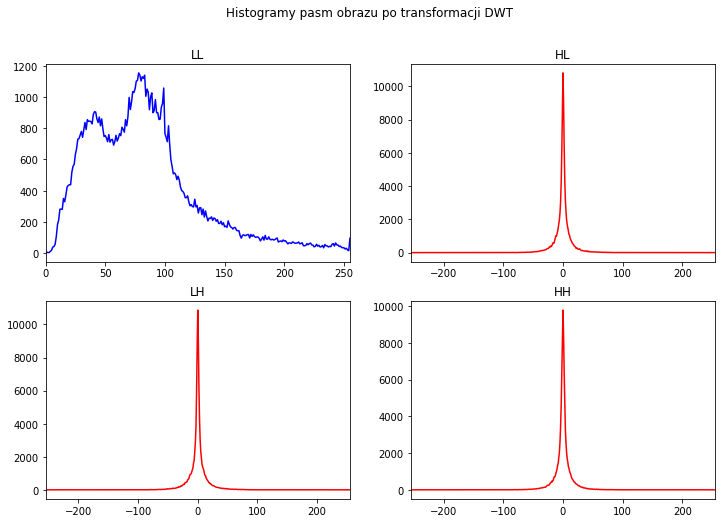

In [32]:

hist_ll = cv2.calcHist([ll], [0], None, [256], [0, 256]).flatten()
# zmiana zakresu wartości i typu danych ze względu na cv2.calcHist() (jak
# wcześniej przy obrazach różnicowych)
hist_lh = cv2.calcHist([(lh + 255).astype(np.uint16)],
                       [0], None, [511], [0, 511]).flatten()
hist_hl = cv2.calcHist([(hl + 255).astype(np.uint16)],
                       [0], None, [511], [0, 511]).flatten()
hist_hh = cv2.calcHist([(hh + 255).astype(np.uint16)],
                       [0], None, [511], [0, 511]).flatten()


plt.plot(hist_image, color="blue")
plt.title("Histogram obrazu originalnego")
plt.xlim([0, 255])
plt.show()

fig = plt.figure()
fig.set_figheight(fig.get_figheight() * 2)  # zwiększenie rozmiarów okna
fig.set_figwidth(fig.get_figwidth() * 2)
plt.subplot(2, 2, 1)
plt.plot(hist_ll, color="blue")
plt.title("LL")
plt.xlim([0, 255])
plt.subplot(2, 2, 3)
plt.plot(np.arange(-255, 256, 1), hist_lh, color="red")
plt.title("LH")
plt.xlim([-255, 255])
plt.subplot(2, 2, 2)
plt.plot(np.arange(-255, 256, 1), hist_hl, color="red")
plt.title("HL")
plt.xlim([-255, 255])
plt.subplot(2, 2, 4)
plt.plot(np.arange(-255, 256, 1), hist_hh, color="red")
plt.title("HH")
plt.xlim([-255, 255])
plt.suptitle("Histogramy pasm obrazu po transformacji DWT")
plt.show()


Histogram niskoczęstotliwościowy wygląda jak przeskalowany w dół, wygładzony histogram obrazu oryginalnego. Histogramy wysokoczęstotliwościowe natomiast są bardzo podobne do histogramu obrazu różnicowego - wysokie piki w okolicach wartości 0. Jest to związane z tym, że obraz LL niesie informację o średniej jasności pikseli w danym miejscu (dlatego przypomina histogram oryginału), a składowe wysokoczęstotliwościowe są nakładane jako różnica na składową niskoczęstotliwościową (dlatego przypominają histogram obrazu różnicowego).

### Entropia obrazu przetransformowanego

In [25]:
H_ll = calc_entropy(hist_ll)
H_lh = calc_entropy(hist_lh)
H_hl = calc_entropy(hist_hl)
H_hh = calc_entropy(hist_hh)
print(f"H(LL) = {H_ll:.4f} \n"
      f"H(LH) = {H_lh:.4f} \n"
      f"H(HL) = {H_hl:.4f} \n"
      f"H(HH) = {H_hh:.4f} \n"
      f"H_śr = {(H_ll+H_lh+H_hl+H_hh)/4:.4f}")


H(LL) = 7.3746 
H(LH) = 5.3553 
H(HL) = 5.2674 
H(HH) = 5.2771 
H_śr = 5.8186


Pasmo niskoczęstotliwościowe ma entropię zbliżoną do entropii obrazu oryginalnego. Natomiast entropie pasm wysokoczęstotliwościowych są dużo niższe, przez co średnia entropia złożenia pasm jest również dużo niższa od obrazu oryginalnego i zbliżona do przepływności bitowej obrazu w formacie PNG.

# Obraz barwny
## Entropia w przestrzeni RGB 

image_col, wymiary: (512, 768, 3), typ danych: uint8, wartości: 1 - 255
H(R) = 7.4402 
H(G) = 7.4424 
H(B) = 7.2868 
H_śr = 7.3898


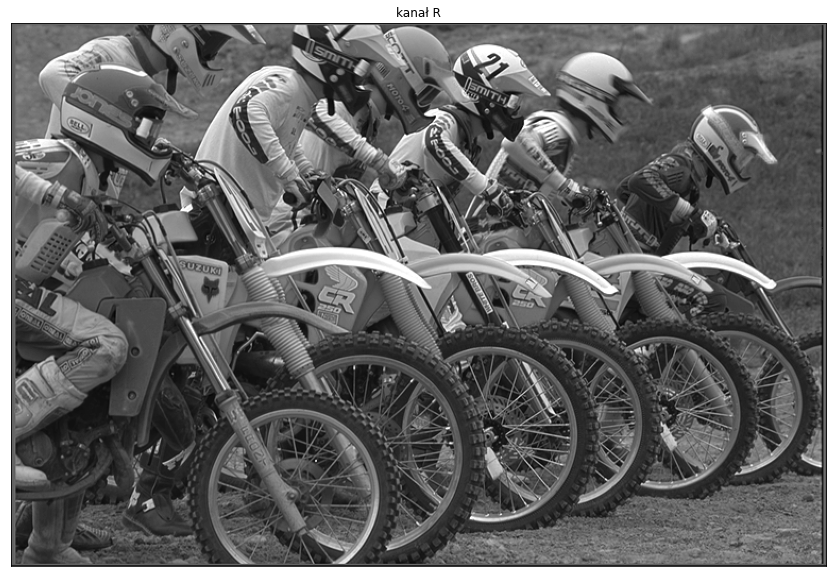

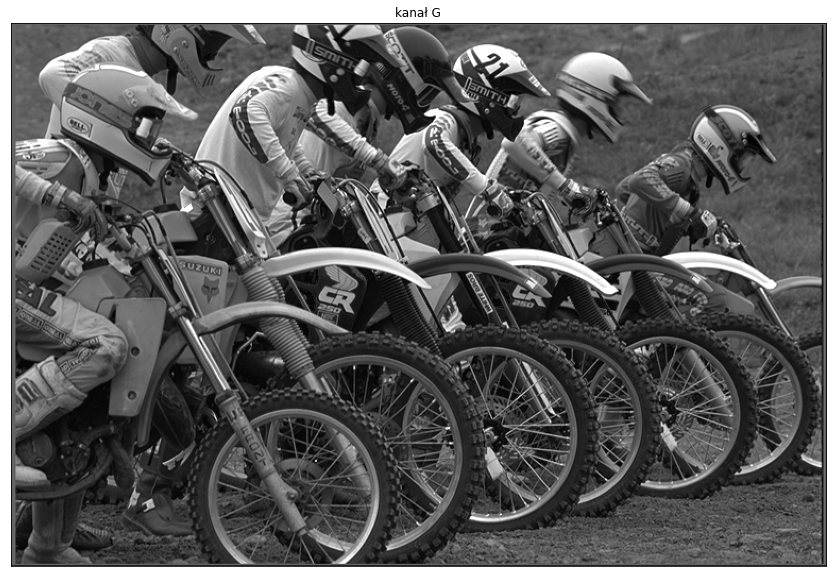

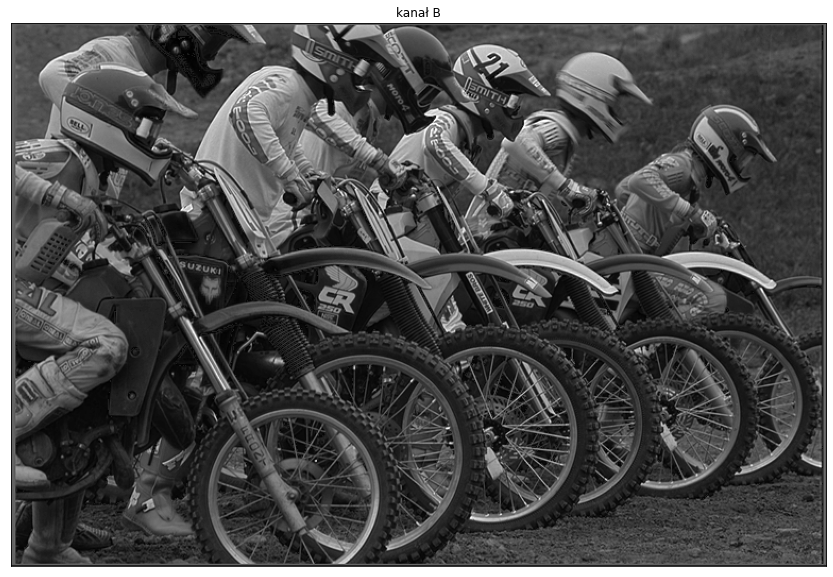

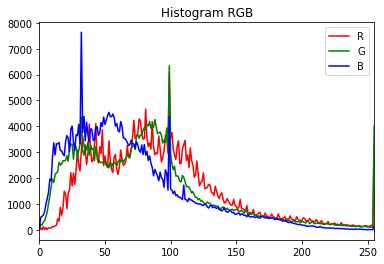

In [36]:

image_col = cv2.imread(img_paths["color"])
printi(image_col, "image_col")

image_R = image_col[:, :, 2]  # cv2.imread() zwraca obrazy w formacie BGR
image_G = image_col[:, :, 1]
image_B = image_col[:, :, 0]

hist_R = cv2.calcHist([image_R], [0], None, [256], [0, 256]).flatten()
hist_G = cv2.calcHist([image_G], [0], None, [256], [0, 256]).flatten()
hist_B = cv2.calcHist([image_B], [0], None, [256], [0, 256]).flatten()

H_R = calc_entropy(hist_R)
H_G = calc_entropy(hist_G)
H_B = calc_entropy(hist_B)
print(f"H(R) = {H_R:.4f} \n"
      f"H(G) = {H_G:.4f} \n"
      f"H(B) = {H_B:.4f} \n"
      f"H_śr = {(H_R+H_G+H_B)/3:.4f}")

imshow(image_R, "kanał R")
imshow(image_G, "kanał G")
imshow(image_B, "kanał B")
plt.figure()
plt.plot(hist_R, color="red", label="R")
plt.plot(hist_G, color="green", label="G")
plt.plot(hist_B, color="blue", label="B")
plt.title("Histogram RGB")
plt.legend()
plt.xlim([0, 255])
plt.show()


Zarówno histogramy jak i obrazy wszystkich kanałów wyglądają podobnie do siebie na wzajem oraz do wyników dla obrazu monochromatycznego.

## Konwersja do YCrCb

image_YCrCb, wymiary: (512, 768, 3), typ danych: uint8, wartości: 3 - 255
H(Y) = 7.3425 
H(Cr) = 4.8374 
H(Cb) = 5.0211 
H_śr = 5.7337


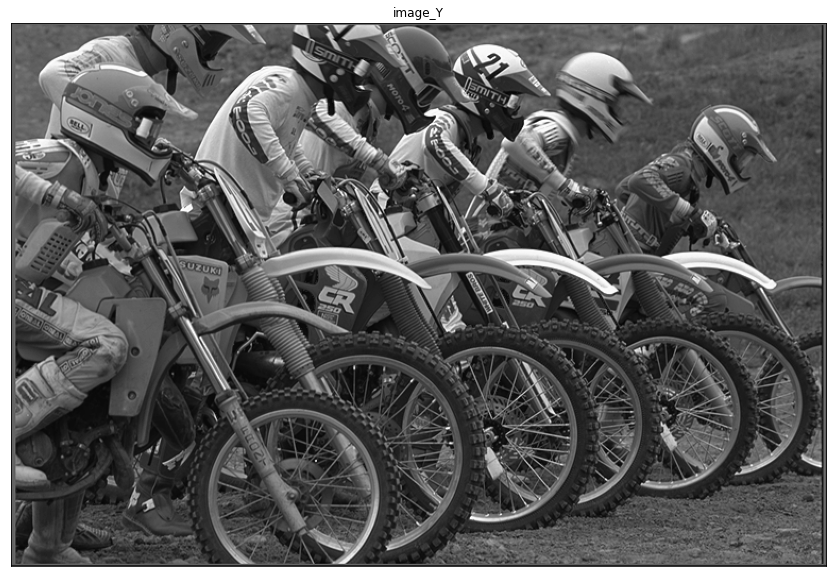

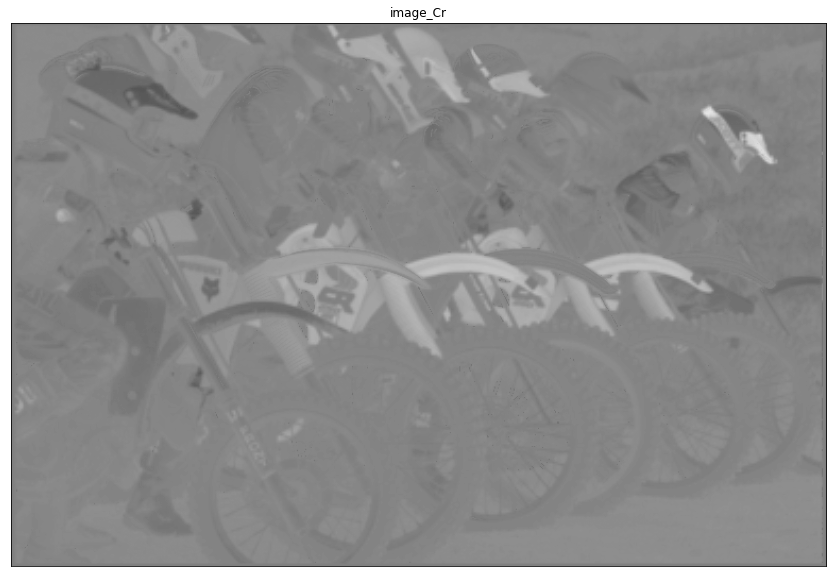

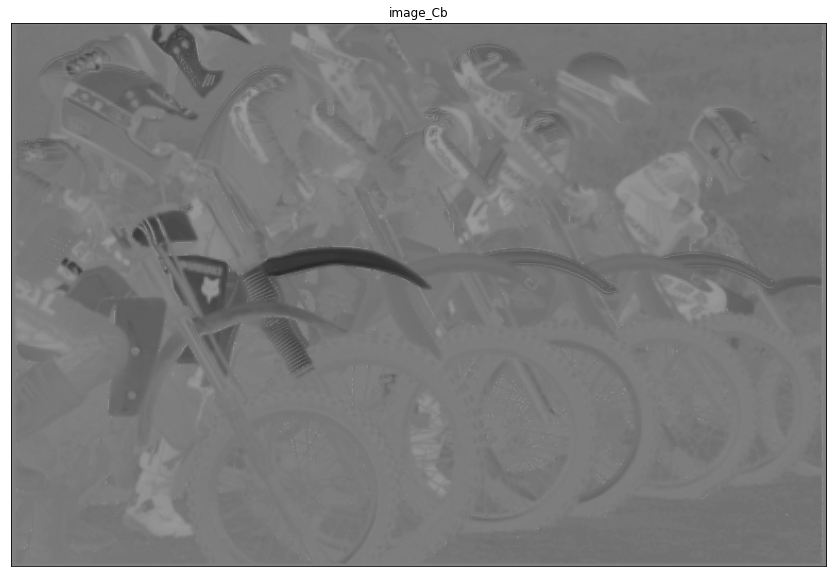

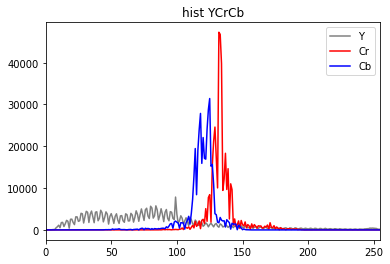

In [38]:

image_YCrCb = cv2.cvtColor(image_col, cv2.COLOR_BGR2YCrCb) ### albo: cv2.COLOR_BGR2YUV
printi(image_YCrCb, "image_YCrCb")

hist_Y = cv2.calcHist([image_YCrCb[:, :, 0]], [0], None, [256], [0, 256]).flatten()
hist_Cr = cv2.calcHist([image_YCrCb[:, :, 1]], [0], None, [256], [0, 256]).flatten()
hist_Cb = cv2.calcHist([image_YCrCb[:, :, 2]], [0], None, [256], [0, 256]).flatten()

H_Y = calc_entropy(hist_Y)
H_Cr = calc_entropy(hist_Cr)
H_Cb = calc_entropy(hist_Cb)
print(f"H(Y) = {H_Y:.4f} \nH(Cr) = {H_Cr:.4f} \nH(Cb) = {H_Cb:.4f} \nH_śr = {(H_Y+H_Cr+H_Cb)/3:.4f}")

imshow(image_YCrCb[:, :, 0], "image_Y")
imshow(image_YCrCb[:, :, 1], "image_Cr")
imshow(image_YCrCb[:, :, 2], "image_Cb")
plt.figure()
plt.plot(hist_Y, color="gray", label="Y")
plt.plot(hist_Cr, color="red", label="Cr")
plt.plot(hist_Cb, color="blue", label="Cb")
plt.title("hist YCrCb")
plt.xlim([0, 255])
plt.legend()
plt.show()


Zarówno obrazy jak i histogramy pokazują, że kanały chrominancyjne mają znacznie mniejszą entropię niż kanał luminancyjny (co zostaje potwierdzone poprzez jej wyliczenie). Jest to związane z definicją tej przestrzeni barw - kanał luminancyjny reprezentuje jasność, więc będzie miał właściwości podobne do histogramów obrazów monochromatycznych. Natomiast kanały chrominancyjne reprezentują przesunięcie barwy w danym kierunku, bez zmiany jasności, dlatego właściwościami będą zbliżone do obrazów różnicowych. Takie właśnie zachowanie obserwujemy na powyższych wykresach i obrazach.

## Zależność zniekształcenia od przepływności
### Obliczenie miar jakości

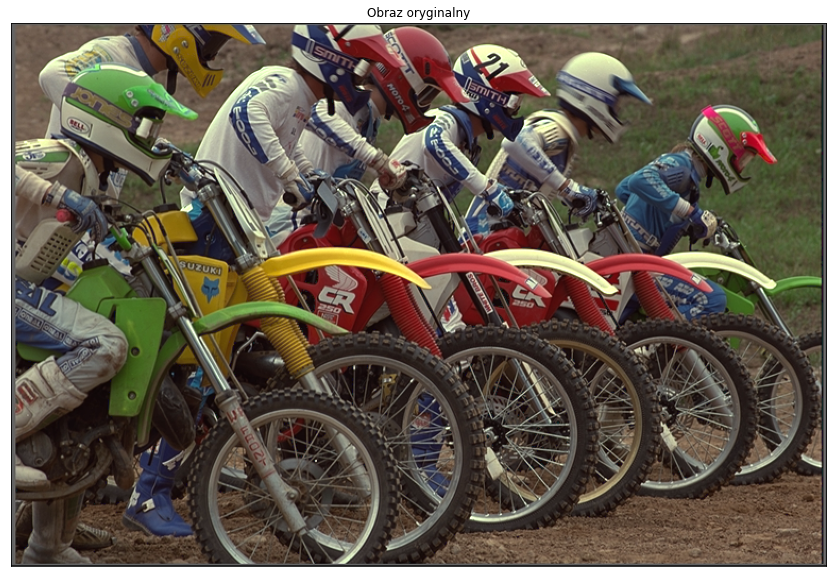

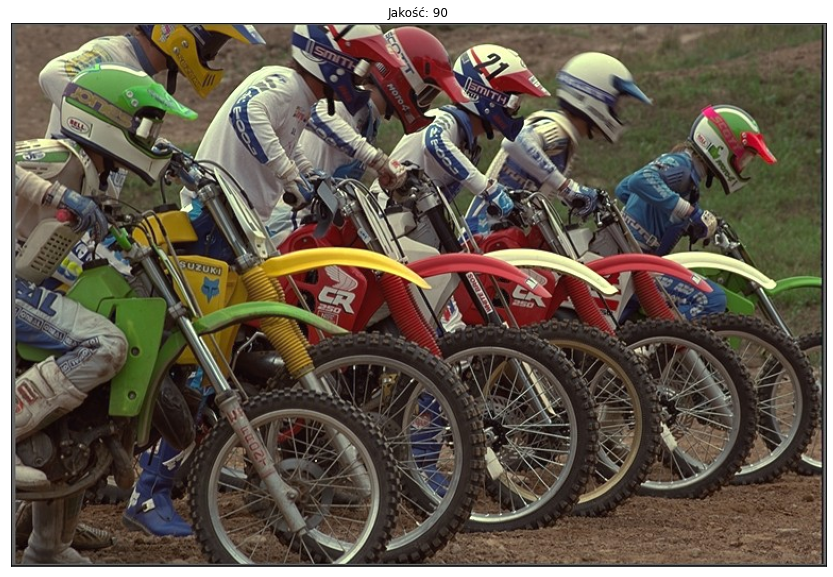

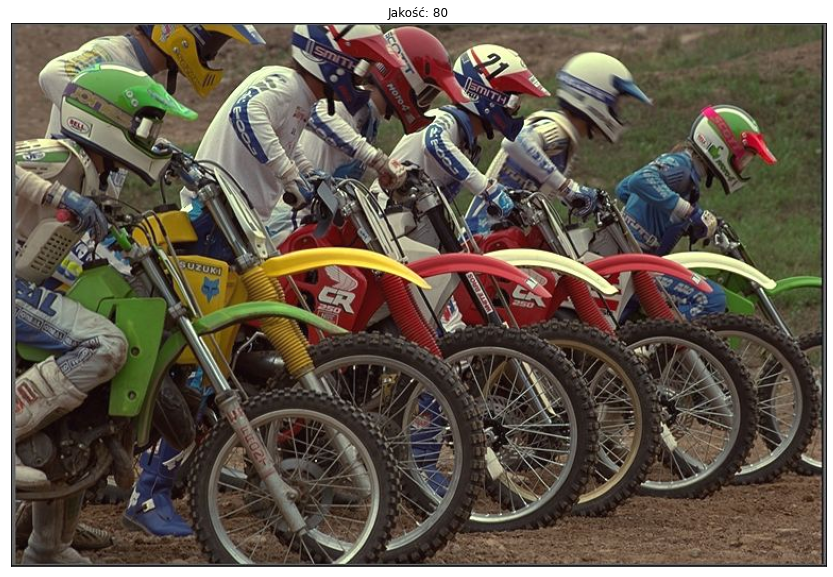

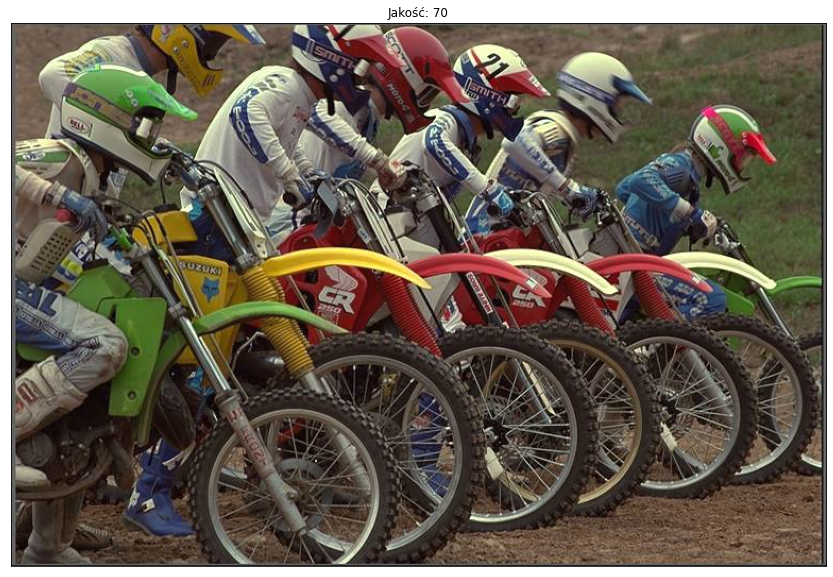

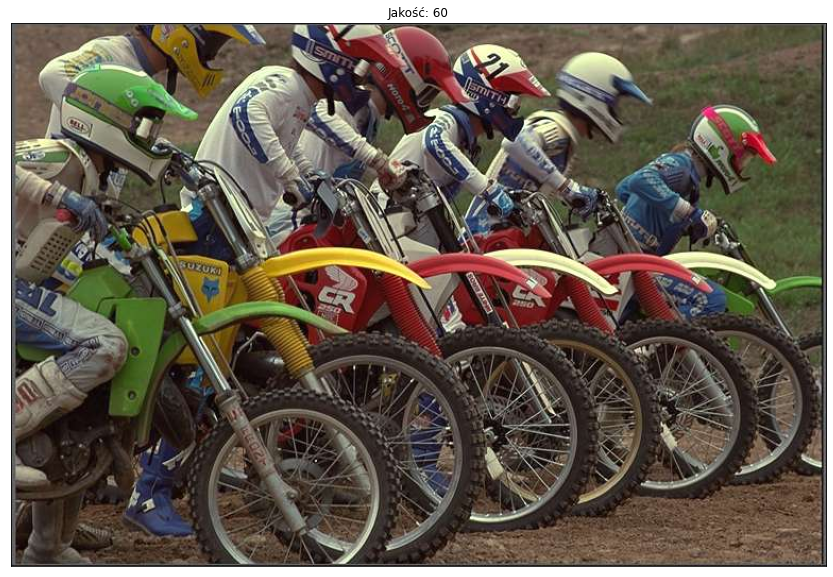

...

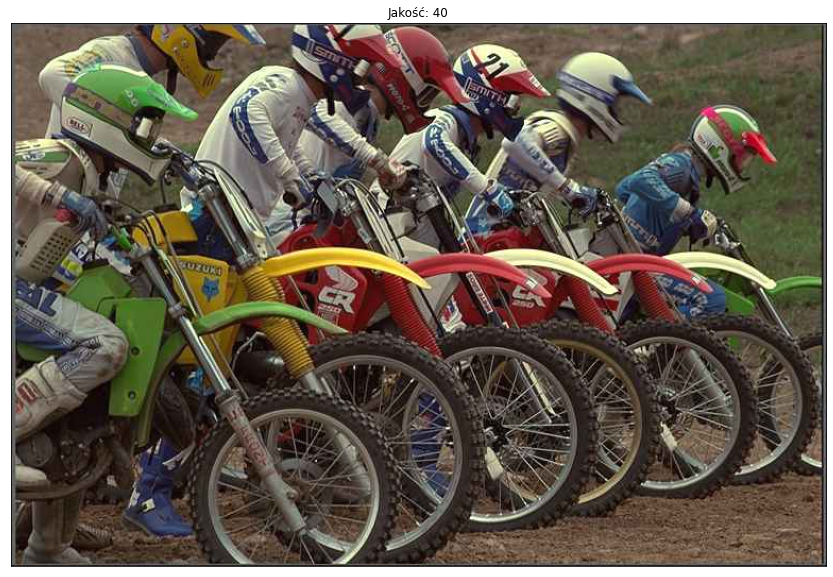

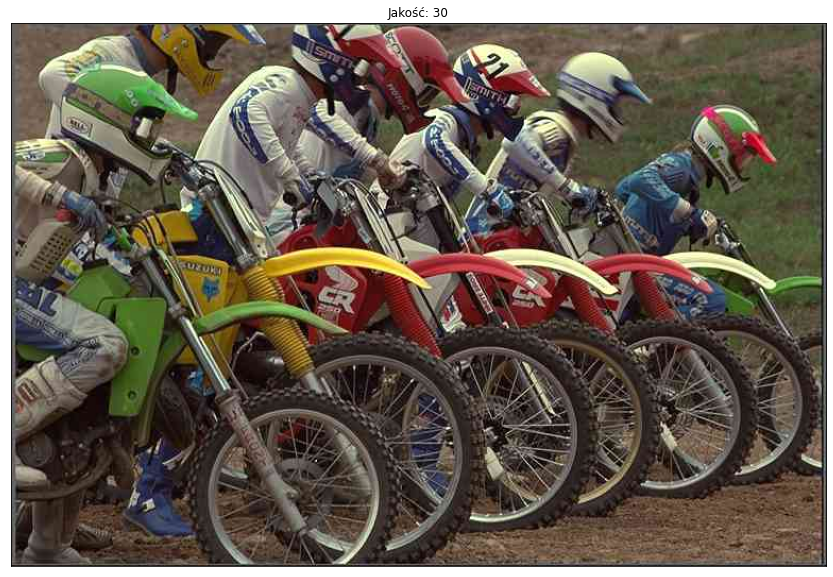

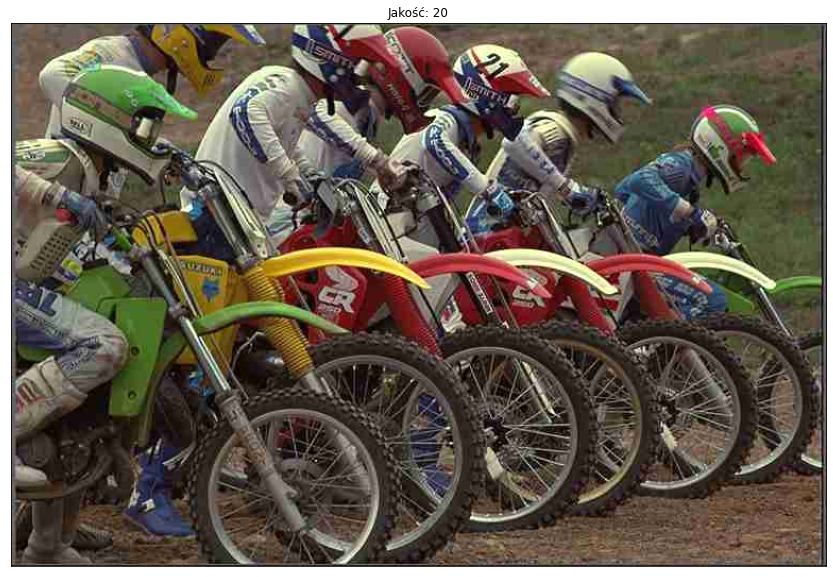

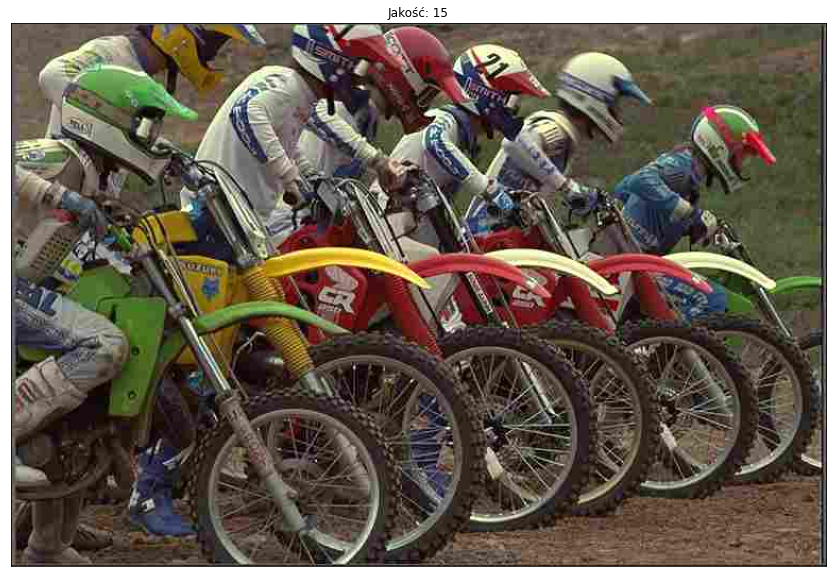

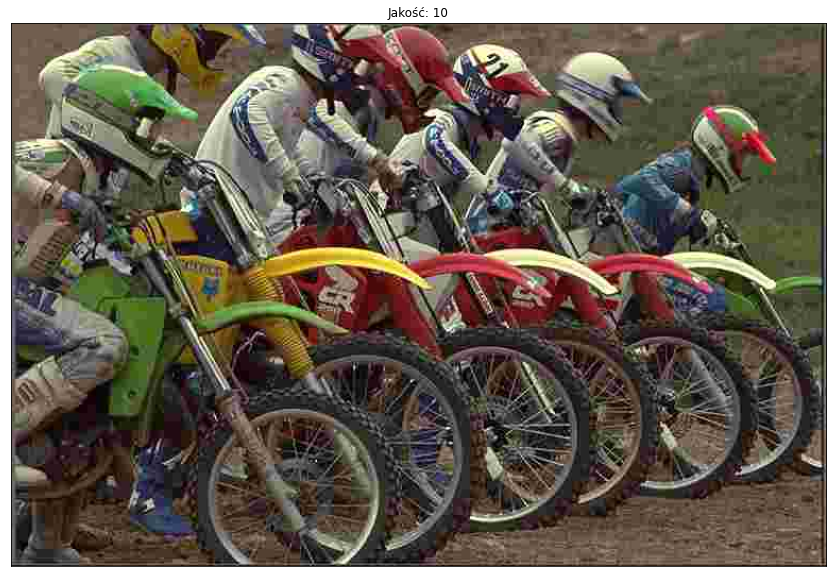

In [56]:

def calc_mse_psnr(img1, img2):
    """ Funkcja obliczająca MSE i PSNR dla różnicy podanych obrazów, zakładana wartość pikseli z przedziału [0, 255]. """

    imax = 255.**2  # maksymalna wartość sygnału -> 255
    """
    W różnicy obrazów istotne są wartości ujemne, dlatego img1 konwertowany jest do typu np.float64 (liczby rzeczywiste)
    aby nie ograniczać wyniku do przedziału [0, 255].
    """
    mse = ((img1.astype(np.float64) - img2)**2).sum() / \
        img1.size  # img1.size - liczba elementów w img1, ==img1.shape[0]*img1.shape[1] dla obrazów mono, ==img1.shape[0]*img1.shape[1]*img1.shape[2] dla obrazów barwnych
    psnr = 10.0 * np.log10(imax / mse)
    return (mse, psnr)


image = cv2.imread(img_paths["color"], cv2.IMREAD_UNCHANGED)
imshow(image, f"Obraz oryginalny")
xx = []  # tablica na wartości osi X -> bitrate
ym = []  # tablica na wartości osi Y dla MSE
yp = []  # tablica na wartości osi Y dla PSNR

# wartości dla parametru 'quality' należałoby dobrać tak, aby uzyskać
# 'gładkie' wykresy...
for quality in [90, 80, 70, 60, 50, 40, 30, 20, 15, 10]:
    out_file_name = f"out_image_q{quality:03d}.jpg"
    """ Zapis do pliku w formacie .jpg z ustaloną 'jakością' """
    out_file_path = str(out_dir_root / out_file_name)

    cv2.imwrite(out_file_path, image, (cv2.IMWRITE_JPEG_QUALITY, quality))
    """ Odczyt skompresowanego obrazu, policzenie bitrate'u i PSNR """
    image_compressed = cv2.imread(out_file_path, cv2.IMREAD_UNCHANGED)
    imshow(image_compressed, f"Jakość: {quality}")
    # image.shape == image_compressed.shape
    bitrate = 8 * os.stat(out_file_path).st_size / \
        (image.shape[0] * image.shape[1])
    mse, psnr = calc_mse_psnr(image, image_compressed)
    """ Zapamiętanie wyników do pózniejszego wykorzystania """
    xx.append(bitrate)
    ym.append(mse)
    yp.append(psnr)


| jakość JPG | bitrate   | opis                                                             |
|:----------:|:---------:|------------------------------------------------------------------|
| 90 - 80    | 3.5 - 2.3 | praktycznie niewidoczne artefakty kompresji                      |
| 70 - 50    | 2.0 - 1.5 | widocznie zniekształcone, ale dalej nie ma większego dyskomfortu |
| 40 - 30    | 1.4 - 1.0 | wyraźnie widoczne, nieprzyjemne zniekształcenia                  |
| 20 - 10    | 0.9 - 0.5 | bardzo mocne zniekształcenia                                     |

### Wykresy miar jakości

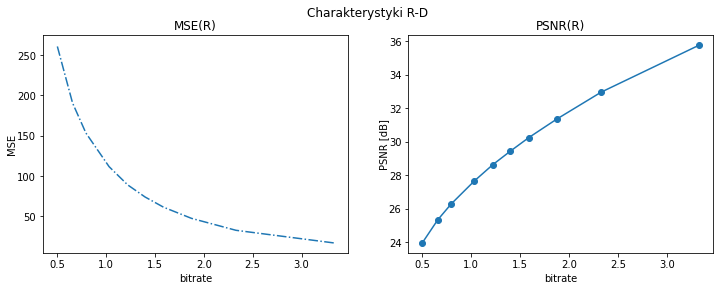

In [54]:
fig = plt.figure()
fig.set_figwidth(fig.get_figwidth() * 2)
plt.suptitle("Charakterystyki R-D")
plt.subplot(1, 2, 1)
plt.plot(xx, ym, "-.")
plt.title("MSE(R)")
plt.xlabel("bitrate")
plt.ylabel("MSE", labelpad=0)
plt.subplot(1, 2, 2)
plt.plot(xx, yp, "-o")
plt.title("PSNR(R)")
plt.xlabel("bitrate")
plt.ylabel("PSNR [dB]", labelpad=0)
plt.show()


### Przepływność bitowa dla kolorowego obrazu w formacie PNG

In [43]:
bitrate = 8 * os.stat(img_paths["color"]).st_size / \
    (image.shape[0] * image.shape[1])
print(f"bitrate: {bitrate:.4f}")

bitrate: 16.4764


Nawet dla jakości 90 przepływność bitowa jest ponad 4-krotnie zmniejszona, pomimo braku widocznego pogorszenia odbioru obrazu. 